In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Unzip the data (alredy done)
#!unzip 'drive/MyDrive/Colab Notebooks/dog-breed-identification.zip' -d 'drive/MyDrive/Colab Notebooks/'

In [ ]:
# import tnsorflow for the project

# This note book making End-To-End Multiclass Dog Breed Classification
# 1. Problem
 # identifing the breed of a dog given an image of dog.
# 2. Data
 # The data is from the Kaggel Dog breed prediction
# 3. Evaluation
 # The file with prediction probability for each data
# 4. Features
 # Information about the data
  # Unstructured data so we have to use deep learning and trasfer learnig
  # 10000+ around images in test and train set


In [ ]:
# Import tenserflow

# Seting our setup

In [2]:
# import tnsorflow
import tensorflow as tf
print('Tf version: ' , tf.__version__)

Tf version:  2.18.0


# Use a good GPU

In [3]:
# Import necessery tools
import tensorflow_hub as hub
print("Tf version hub", hub.__version__)

Tf version hub 0.16.1


In [4]:
# Check for GPU availability
print('GPU', 'available (Yess!!!!!!!!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

GPU available (Yess!!!!!!!!!)


## Getting our data ready (into tensors)

with all machin learnig models lets start by accessing the data from labes of the data

In [5]:
labels_csv = pd.read_csv('drive/MyDrive/Colab Notebooks/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


from matplotlib import pyplot as plt
import seaborn as sns
_df_0.groupby('id').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby('breed').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['breed'].value_counts()
    for x_label, grp in _df_2.groupby('id')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('id')
_ = plt.ylabel('breed')

In [8]:
#  How many images are in each bread
labels_csv['breed'].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

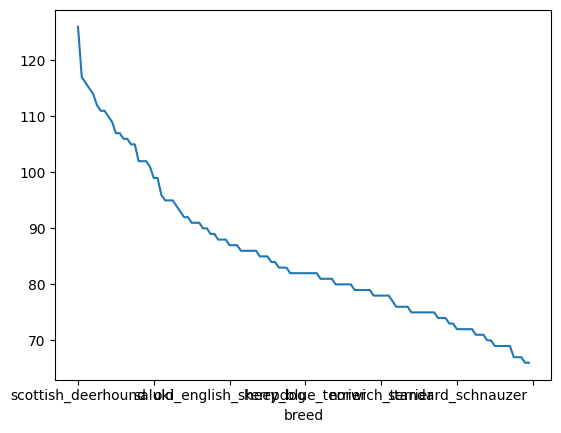

In [9]:
labels_csv['breed'].value_counts().plot()

In [10]:
labels_csv['breed'].value_counts().median()

82.0

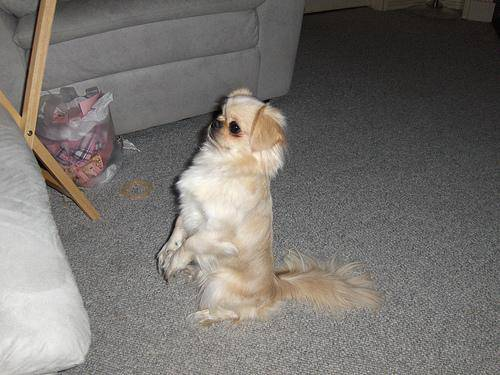

In [11]:
# Lets view an image
from IPython.display import Image
Image('drive/My Drive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg')

## Getting images and labels
lets get the path names

In [12]:
#  Create path names using list comprihension
filenames = ['drive/My Drive/Colab Notebooks/train/'+fname+ '.jpg' for fname in labels_csv['id']]

filenames

['drive/My Drive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab Notebooks/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab Notebooks/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Colab Notebooks/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Colab Notebooks/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Colab Notebooks/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Colab Notebooks/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Colab Notebooks/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/My Drive/Colab Notebooks/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/My Drive/Colab Notebooks/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/My Drive/Colab Notebooks/train/00693b8bc2470375cc744a639

In [ ]:
# Check wheatere number of filename smathes number of actual image files

In [13]:
import os
if len(os.listdir('drive/My Drive/Colab Notebooks/train/')) == len(filenames):
  print("File name match actual amount of files")
else:
  print("File name do not match actual amount of files")

File name match actual amount of files


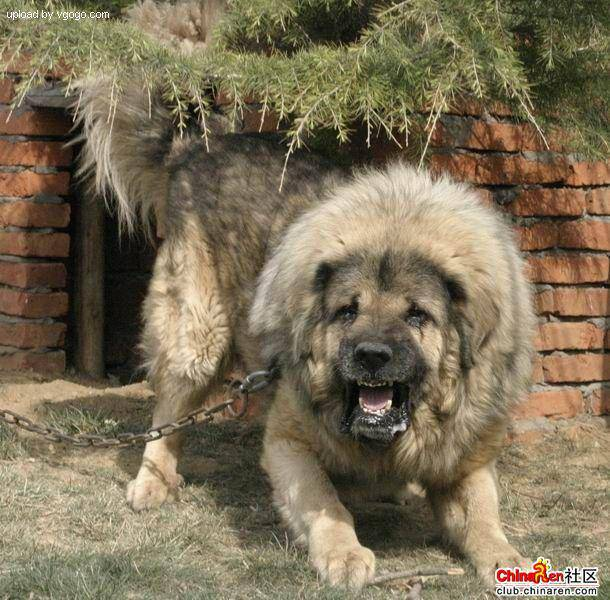

In [14]:
# One more check
Image(filenames[9000])

In [15]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Science we got trainiig patha then prepare lelels

In [16]:
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
len(labels)

10222

In [18]:
# See if number of lebels mathes the number of lebels

if len(labels) == len(filenames):
  print('Number of labels match the number of filenames')
else:
  print('Number of labels do not match the number of filenames')

Number of labels match the number of filenames


In [19]:
# Find the unique label valus using numpy
unique_breeds = np.unique(labels)
print(np.array(unique_breeds))
len(unique_breeds)

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

120

In [20]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
# Turn every label into a bool array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
# Example turning boolean array into integers
print(labels[0]) # Text label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # Integer representation

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [25]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
filenames[:2]

['drive/My Drive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

### Creating our own validation set
We are going to create our own set

In [27]:
# Setup x and y varibels
x = filenames
y = boolean_labels


In [28]:
len(filenames)

10222

We going to start experimenting ~1000 images and increase if need

In [29]:
# Set nuber of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [30]:
# Lets split our data into train and validation
from sklearn.model_selection import train_test_split

#Split the data
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(x_train),len(y_train) ,len(x_val),len(y_val)


(800, 800, 200, 200)

In [31]:
# x_traina nd y_tain
x_train[:2], y_train[:2]

(['drive/My Drive/Colab Notebooks/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Colab Notebooks/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False

## Preprocessing images (turning images into tensors)
# Preprocss our iamges into Tensors we'ar going to write functions does a few things:
1. Take an image file path as input
2. Use Tensor flow to read the file and save it to a variable , 'image'
3. Turn our iange in to tensors
4. normalize the image
5. Resize the image to be shape of (224,224)
6. Return the modified data

In [32]:
# Developing functionalities
from matplotlib.pyplot import imread
image =  imread(filenames[42])
image.shape

(257, 350, 3)

In [33]:
image.max()

np.uint8(255)

In [34]:
image.min()

np.uint8(0)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
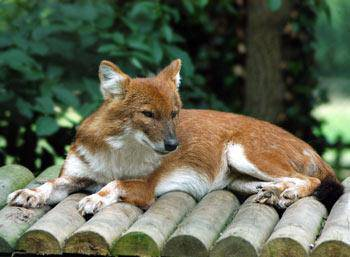

In [35]:
image

In [36]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we have seen what iamge seen like tensor

In [37]:
# Turn image into tensor
IMG_SIZE = 224

# Create a function for pre processing
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turn into Tensor
  '''
  # Read the image file
  image  = tf.io.read_file(image_path)
  # Turn the jepg image into  numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image  = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our size
  image  = tf.image.resize(image , size=[IMG_SIZE, IMG_SIZE])

  return image




In [ ]:
# tensor = tf.io.read_file(filenames[40])
# tensor

In [ ]:
# tensor = tf.image.decode_jpeg(tensor, channels=3)

In [ ]:
# tensor = tf.image.convert_image_dtype(tensor, tf.float32)
# tensor

## Turning  into batches

In [38]:
 # use 32 images per batch

 # We need our data of tensor Tuples `(image , label)`

# Create a siple function to return a tuple

def get_image_label(image_path, label):
  '''
  Process the image and return a tuple of (image , label)
  '''
  image = process_image(image_path)
  return image, label

In [39]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have to turn tupel into tensors in the form image label , lets make a function to turn all of our data into batches

In [40]:
# Image to batches
BATCH_SIZE = 32

# Create a function to turn the data into batch
def create_data_batches(x, y=None,
                        batch_size=BATCH_SIZE,
                        valid_data=False,
                        test_data=False):
  '''
  reates batches of data out of image x and label y pairs
  Suffels the data if its traingi data doesnt suffel if its validation data
  aso acceps test data as input (nolabels)
  '''
  # if data ia atest dataset, we are probably sont have labels
  if test_data:
    print('Creating test data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid datset , we dont need to suffel it
  elif valid_data:
    print('Creating validation data batches.....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches.....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    #  Suffel path names and labels before mapping umage processor funciotn is faster than
    data = data.shuffle(buffer_size=len(x))
    # Creaet image label tuples
    data = data.map(get_image_label)

    # Turn the traing data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch




In [41]:
# Create traing and validation data batches

train_data = create_data_batches(x_train, y_train)

val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches.....
Creating validation data batches.....


In [42]:
# Check out different attribute es of our daat batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

our data is now ready now visualize the data

In [43]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images, labels):
  '''
  Display a plot of 25 images and their labels from a data batch
  '''
  # Set pu the figure
  plt.figure(figsize=(10,10))

  # Loop through 25
  for i in range(25):
    # Create subplots (5, row, 5, column)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turns the grid lines off
    #plt.axis('off)

In [44]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.07715336, 0.08107493, 0.05754552],
          [0.07715336, 0.08107493, 0.05754552],
          [0.07715336, 0.08107493, 0.05754552],
          ...,
          [0.01960784, 0.03529412, 0.03137255],
          [0.03137255, 0.04705883, 0.04313726],
          [0.03137255, 0.04705883, 0.04313726]],
 
         [[0.09416142, 0.09808299, 0.07455357],
          [0.09416142, 0.09808299, 0.07455357],
          [0.09416142, 0.09808299, 0.07455357],
          ...,
          [0.02357318, 0.03925946, 0.03533789],
          [0.03132878, 0.04701506, 0.04309349],
          [0.03132878, 0.04701506, 0.04309349]],
 
         [[0.09803922, 0.10196079, 0.07843138],
          [0.09803922, 0.10196079, 0.07843138],
          [0.09803922, 0.10196079, 0.07843138],
          ...,
          [0.03013831, 0.04582458, 0.04190301],
          [0.02745098, 0.04313726, 0.03921569],
          [0.02745098, 0.04313726, 0.03921569]],
 
         ...,
 
         [[0.24744257, 0.20038375, 0.15332492],
          [0.27039

In [45]:
len(train_images), len(train_labels)

(32, 32)

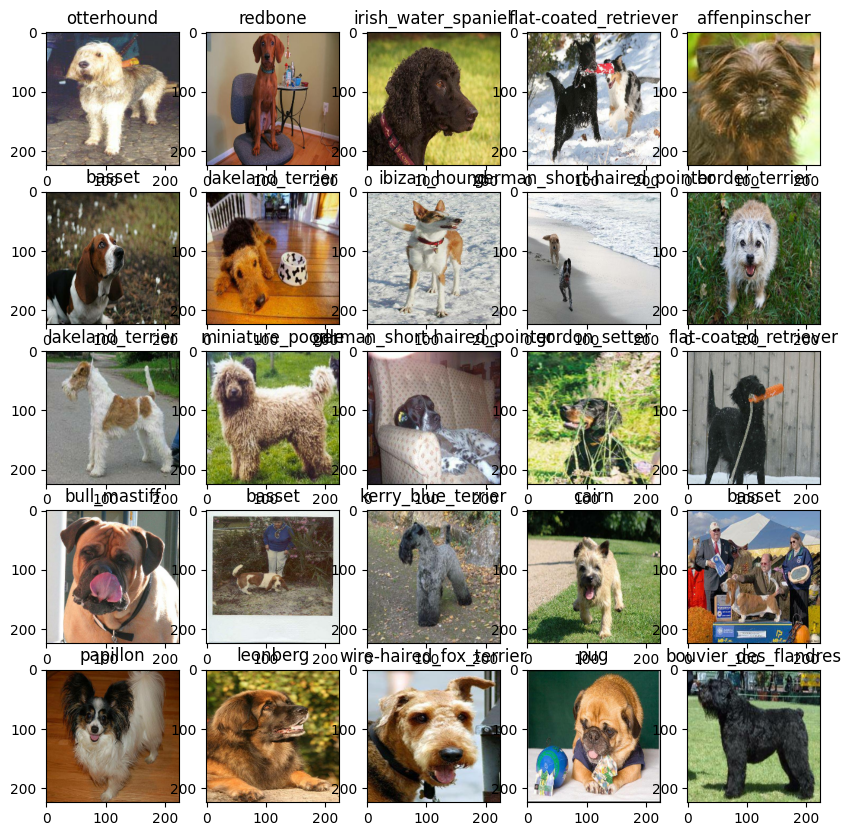

In [46]:
# Now visualize the data in trainging batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

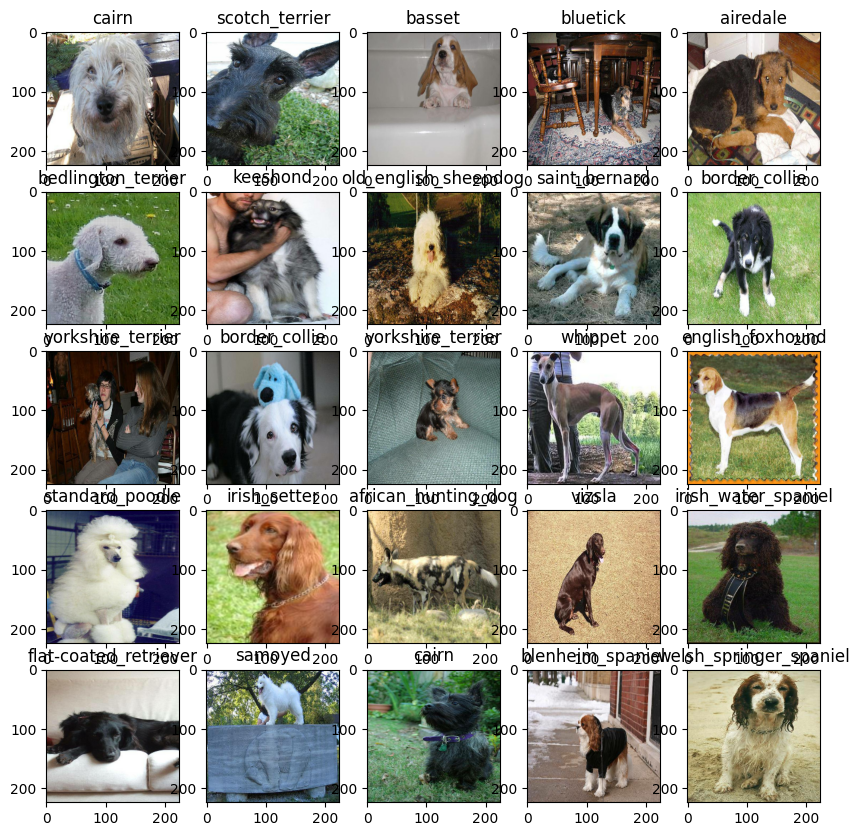

In [47]:
# Now visualize our validation set

val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building Model

Before we build a model , there are few things we need to define:
* The input shape (our images shape , in the form of tensors) to our model
* The URL of the model we want to use

In [ ]:
#!pip install 'tensorflow_hub>=0.6.0'

In [48]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch , height , width, color channels
# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensor flow Hub
NEW_MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

# Batch input shape.


In [49]:
INPUT_SHAPE, OUTPUT_SHAPE

([None, 224, 224, 3], 120)

In [50]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np

def load_mobilenet_v2_hub():
    # Use a specific TF Hub model URL
    model_url = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"

    # Create input layer
    inputs = tf.keras.Input(shape=(224, 224, 3))

    # Preprocess input
    x = tf.keras.layers.Rescaling(1./255)(inputs)

    try:
        # Load the model from TF Hub
        hub_model = hub.load(model_url)

        # Create a callable model
        def model_fn(x):
            return hub_model(x, training=False)

        # Create a TensorFlow function
        hub_layer = tf.keras.layers.Lambda(model_fn)

        # Apply the hub layer
        features = hub_layer(x)

        # Add output layer
        outputs = tf.keras.layers.Dense(
            1000,
            activation='softmax',
            name='predictions'
        )(features)

        # Create the model
        model = tf.keras.Model(inputs=inputs, outputs=outputs)

        # Compile the model
        model.compile(
            optimizer='adam',
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )

        return model

    except Exception as e:
        print(f"Detailed error: {e}")
        raise

# Print versions
print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", hub.__version__)

# Create and test the model
model = load_mobilenet_v2_hub()
model.summary()

# Test with random input
test_input = np.random.random((1, 224, 224, 3)).astype(np.float32)
predictions = model.predict(test_input)
print("Prediction shape:", predictions.shape)

TensorFlow version: 2.18.0
TensorFlow Hub version: 0.16.1


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling (Rescaling)                │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 1664)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ predictions (Dense)                  │ (None, 1000)                │       1,665,000 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,665,000 (6.35 MB)

 Trainable params: 1,665,000 (6.35 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Prediction shape: (1, 1000)


In [51]:
import tensorflow as tf
import numpy as np

def create_mobilenet_v2_model():
    try:
        # Load pre-trained MobileNetV2 model
        base_model = tf.keras.applications.MobileNetV2(
            input_shape=(224, 224, 3),  # Standard input shape
            include_top=False,  # Exclude the top (classification) layers
            weights='imagenet',  # Use pre-trained ImageNet weights
            pooling='avg'  # Global average pooling
        )

        # Freeze the base model layers
        base_model.trainable = False

        # Build the full model
        model = tf.keras.Sequential([
            base_model,
            tf.keras.layers.Dense(120, activation='softmax')  # Standard ImageNet classes
        ])

        # Compile the model
        model.compile(
            optimizer='adam',
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )

        return model

    except Exception as e:
        print(f"Error in model creation: {e}")
        raise

# Print TensorFlow version
print("TensorFlow version:", tf.__version__)

# Create and summarize the model
model = create_mobilenet_v2_model()
model.summary()

# Test with random input
test_input = np.random.random((1, 224, 224, 3)).astype(np.float32)
predictions = model.predict(test_input)
print("Prediction shape:", predictions.shape)

TensorFlow version: 2.18.0
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 1280)                │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
Prediction shape: (1, 120)


In [52]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [53]:
## Creating callbacks
# Callbacks are helper functions use training to do such things as save its progress check its progress or stop trainging
# # TenserBoard - call back

# Load Tenserboard notebook extension
# create a function which is able to save logs to a directry and pass it to our models fit()

%load_ext tensorboard


In [55]:
import datetime

# Create a function to build a Tenserboard callback
def create_tenserboard_callbacks():
  # Create a log directory for storing Tenserboard logs
  logdir = os.path.join("drive/My Drive/Colab Notebooks/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
## Early Stopping callback
# EarlyStopping
# [source]

# EarlyStopping class
# keras.callbacks.EarlyStopping(
#     monitor="val_loss",
#     min_delta=0,
#     patience=0,
#     verbose=0,
#     mode="auto",
#     baseline=None,
#     restore_best_weights=False,
#     start_from_epoch=0,
# )
# Stop training when a monitored metric has stopped improving.

In [56]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [ ]:
## Training a model (on subset of data)

# Our first model is only with 1000 images make sure it is working

In [57]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [58]:
# Checking GPU is present or not
print("GPU", "ava yess!!!" if tf.config.list_physical_devices('GPU') else "not ava")

GPU ava yess!!!


In [ ]:
# Lets create a function to ccreate a model using create model

In [59]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 1280)                │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [60]:
# Build a function to train and return a trained model
print(NUM_EPOCHS)

def train_model():
    # Create a model
    model = create_mobilenet_v2_model()

    # Create a new TensorBoard callback
    tensorboard_callback = create_tenserboard_callbacks()

    # Fit the model to the data passing it the callbacks we created
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,  # Corrected 'epoches' to 'epochs'
              validation_data=val_data,  # Corrected 'validate_on_data' to 'validation_data'
              validation_freq=1,  # Corrected 'validate_on_freq' to 'validation_freq'
              callbacks=[tensorboard_callback, early_stopping])

    return model



100


In [ ]:
# Fit the model to the daat

model = train_model()

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 143s 395ms/step - accuracy: 0.0518 - loss: 4.8183 - val_accuracy: 0.2350 - val_loss: 3.6596
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - accuracy: 0.6145 - loss: 2.2125 - val_accuracy: 0.4650 - val_loss: 2.4392
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - accuracy: 0.9309 - loss: 0.9384 - val_accuracy: 0.5350 - val_loss: 1.9461
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 201ms/step - accuracy: 0.9801 - loss: 0.4793 - val_accuracy: 0.5950 - val_loss: 1.7665
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 147ms/step - accuracy: 0.9939 - loss: 0.2872 - val_accuracy: 0.5800 - val_loss: 1.7110
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 169ms/step - accuracy: 0.9993 - loss: 0.2040 - val_accuracy: 0.6100 - val_loss: 1.6185
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 198ms/step - accuracy: 0.9976 - loss: 0.1482 - val_accuracy: 0.6150 - val_loss: 1.5910
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - accuracy: 0.9986 - loss: 0.1195 - val_ac

In [ ]:
(val_data)


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
(train_data)

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Our model is over fitting far better than the validation data set , what are tthe
# Way to pevent the model over fitting

## Note Overfitting  to begin with is good

In [ ]:
# Evaluate the performance

In [ ]:
### Checking the tenser board Logs
# `%tensorboard --logdir drive/My Drive/Colab Notebooks/logs   and visualize this`

In [ ]:
%tensorboard --logdir drive/My\ Drive/Colab\ Notebooks/logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
## Track your exp

#Making and evaluating predictions using a trained model

# Make prediction on validation data

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 748ms/step


array([[7.3341245e-04, 1.4388922e-03, 3.0160247e-04, ..., 1.0048833e-04,
        1.3398564e-04, 1.7450693e-03],
       [1.9819787e-04, 7.5386034e-04, 3.7609537e-03, ..., 5.3025196e-05,
        4.7943355e-03, 2.2035313e-04],
       [6.8387693e-05, 5.5398763e-04, 3.0487269e-04, ..., 1.6329868e-04,
        7.4194009e-05, 5.2213958e-03],
       ...,
       [2.1891535e-04, 6.9279509e-04, 6.3349149e-04, ..., 3.0100229e-04,
        5.5417073e-05, 2.4874124e-04],
       [6.2368589e-04, 7.9708057e-05, 4.1113156e-04, ..., 1.9912939e-05,
        4.9076367e-05, 7.4411561e-03],
       [6.3319679e-04, 7.0966737e-05, 3.9085030e-04, ..., 2.0054616e-03,
        4.6879007e-04, 7.1235187e-04]], dtype=float32)

In [ ]:
len(predictions[0])
np.sum(predictions[1])

np.float32(1.0)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First Prediction (Soft max having range between (0,1))
index = 7
print(predictions[index])

print(f"Max value (Probability of prediction) {np.max(predictions[0])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"max index: {np.argmax(predictions[index])}")
print(f"Predict lable : {unique_breeds[np.argmax(predictions[index])]}")

[8.10630590e-05 5.68466901e-04 6.56458224e-06 3.28639930e-04
 1.13170390e-05 1.80522165e-05 5.21491602e-05 1.80881489e-05
 6.82582177e-05 2.05770139e-05 7.60509225e-04 2.78589316e-04
 2.03760032e-06 2.79806791e-05 5.11434300e-05 7.37479641e-05
 1.71718042e-04 3.09158677e-05 1.17967356e-05 1.96175788e-05
 6.84936647e-04 1.70186122e-05 7.90853107e-07 7.19950913e-05
 2.05071842e-06 1.52831690e-05 7.34902933e-05 8.65608126e-06
 2.93986268e-05 5.36438529e-06 7.87270073e-06 6.23752479e-04
 9.15386845e-05 3.36172670e-04 3.37283600e-05 4.35324691e-05
 8.83488428e-06 1.00323427e-06 5.21359561e-06 3.12170391e-06
 8.05394448e-05 3.69669328e-06 1.53713117e-05 1.08363984e-05
 3.07394112e-05 4.21044570e-06 1.22475758e-05 1.23024565e-05
 3.89140732e-05 5.08921839e-05 1.50016795e-05 3.05330946e-06
 1.00288470e-03 1.19877615e-04 3.82091594e-06 2.23121106e-06
 4.29294914e-06 3.45401604e-05 2.67431315e-05 1.02297997e-03
 2.04369462e-05 3.34159540e-06 1.33352980e-04 2.21584487e-05
 1.25796811e-04 1.653554

In [ ]:
unique_breeds[82]

'old_english_sheepdog'

In [61]:
# Compaire in visual way
# prediction probabilities are also known as confidence levels
def get_pred_lable(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get predicted label for each validation image
pred_labels = [get_pred_lable(x) for x in predictions]
pred_labels

['staffordshire_bullterrier']

In [62]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now science our validaion data in batch dataset,
we will have to unbatify it to make predictions

In [63]:
## Tenser flow unbatch
def unbatchify(data):
  """
  Takes a batched data set of (image and , label) Tensors and turns separate arrays
  of images and labels
  """
  images = []
  labels = []


  # Loop through unbatch daat

  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [64]:
get_pred_lable(val_images[0])

'vizsla'

In [ ]:
# Now we have prediction labels
# and validation labels , lets visualize them

In [ ]:
# fun - takes an array of predictions probabilitiesan array of
# true labels and an array of images and integers
# convert the prediction probabilities to prediction labels
# plot the predictions, true labels and images side by side
# highlight correct predictions in green and incorrect predictions in red

In [65]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  view the prediction
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred lable
  pred_label = get_pred_lable(pred_prob)

  #Plot Images and remove
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change the plot title to be predicted , probability of prediction
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label ), color=color)



In [66]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=12)

IndexError: index 12 is out of bounds for axis 0 with size 1

In [ ]:
# Now we have one func to visualize our models top prediction this function

# 1. Take an input of prediction probabilities array and a ground truth
# find the prediction using get_pred_lable()
# 2. Plot the prediction, prediction probability and ground truth label side by side
# 3. Color the title of the plot based on whether the prediction is correct or wrong#

In [67]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth labels
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_lable(pred_prob)

  # top_10_pred_indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]


  # Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="gray")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



In [ ]:
predictions[0].argsort()[-10:][::-1] # Top 10 max value indese values reversed

array([ 70, 109, 103,  59,  82,  73, 116,  17, 106,  77])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]] # Actual value

array([0.42148963, 0.2307554 , 0.05669285, 0.05476559, 0.04194224,
       0.02867193, 0.024057  , 0.02187047, 0.01331348, 0.01211774],
      dtype=float32)

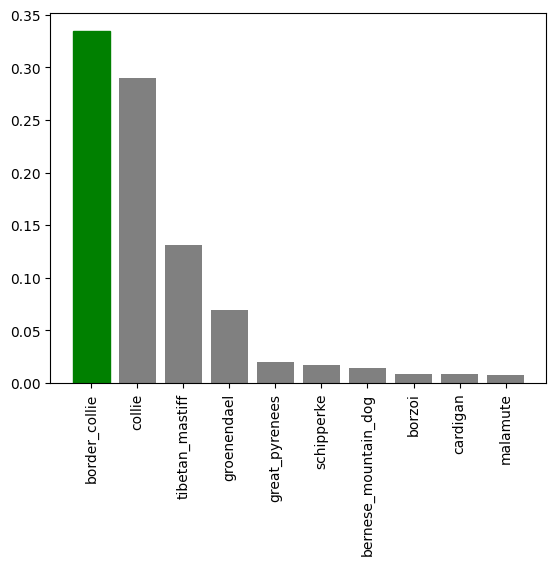

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
# we got some function to have to vizualize


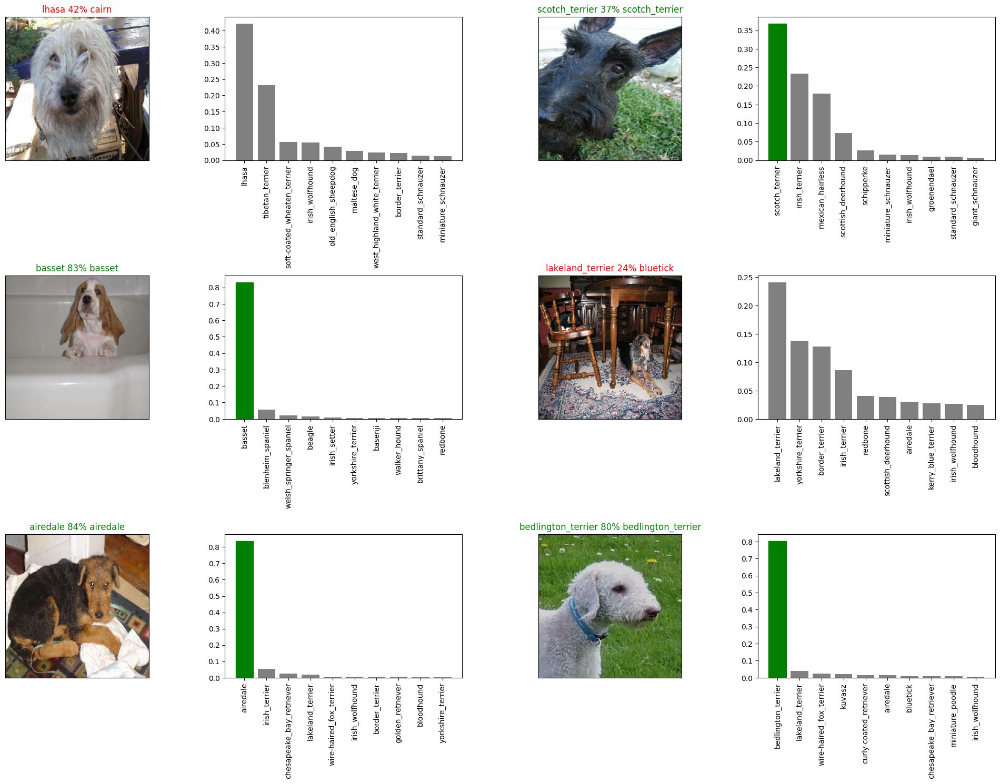

In [ ]:
# Checkout a few predictions and their different values
i_multiplier = 0 # Change to 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i + 1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n = i+ i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n= i+ i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


In [68]:
# Confusion matrix for the model
from sklearn.metrics import confusion_matrix
import itertools
import matplotlib.pyplot as plt
import numpy as np



In [69]:
# Saving the model and reloading a trained model
def save_model(model, suffix=None):
  """
  Save a given model in a directory models directory and appendes a suffix string
  """
  # Create a model directory pathname with Current time

  modeldir = os.path.join("drive/My Drive/Colab Notebooks/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".h5"

  print(f"Saving model to :  {model_path}...")
  model.save(model_path)
  return model_path


In [70]:
# Create a function to lad a model

def load_model(model_path):
  """
  Loades a model to the project
  """

  print(f"Loading saved model form : {model_path}")
  model = tf.keras.models.load_model(model_path)
  return model

In [ ]:
# Save our model trained on 1000 images

save_model(model, suffix="1000-images-mobilenetv2-adam")

Saving model to :  drive/My Drive/Colab Notebooks/models/20250326-05361742967370-1000-images-mobilenetv2-adam.h5...


'drive/My Drive/Colab Notebooks/models/20250326-05361742967370-1000-images-mobilenetv2-adam.h5'

In [71]:
# Load the model
loaded_1000_image_model = load_model("drive/My Drive/Colab Notebooks/models/20250326-05361742967370-1000-images-mobilenetv2-adam.h5")

Loading saved model form : drive/My Drive/Colab Notebooks/models/20250326-05361742967370-1000-images-mobilenetv2-adam.h5


In [ ]:
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 180ms/step - accuracy: 0.6557 - loss: 1.4671


[1.520350694656372, 0.6349999904632568]

In [72]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 501ms/step - accuracy: 0.6557 - loss: 1.4671


[1.520350694656372, 0.6349999904632568]

In [ ]:
# Train on full data set to train on 10000 data

In [73]:
# Training a big dog model on full data
len(x), len(y)

(10222, 10222)

In [74]:
x[:10]

['drive/My Drive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Colab Notebooks/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Colab Notebooks/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Colab Notebooks/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Colab Notebooks/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Colab Notebooks/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Colab Notebooks/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Colab Notebooks/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [75]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [76]:
# Craete a data batch
full_data = create_data_batches(x,y)

Creating training data batches.....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_mobilenet_v2_model()

In [ ]:
# Create full model callbacks

full_model_tensorboard = create_tenserboard_callbacks()

# No validation set when trainging on all the dadato, so we cant monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data

full_model.fit(x=full_data, epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 53s 142ms/step - accuracy: 0.4441 - loss: 2.5564
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - accuracy: 0.8429 - loss: 0.5608
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 126ms/step - accuracy: 0.9095 - loss: 0.3627
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 128ms/step - accuracy: 0.9414 - loss: 0.2517
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 129ms/step - accuracy: 0.9668 - loss: 0.1812
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 128ms/step - accuracy: 0.9821 - loss: 0.1307
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 129ms/step - accuracy: 0.9921 - loss: 0.0961
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 128ms/step - accuracy: 0.9954 - loss: 0.0747
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 126ms/step - accuracy: 0.9976 - loss: 0.0606
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.9979 - loss: 0.0503
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - accuracy: 0.9988 - loss: 0.0398
Epoch 12

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-adam")

Saving model to :  drive/My Drive/Colab Notebooks/models/20250326-06181742969925-full-image-set-mobilenetv2-adam.h5...


'drive/My Drive/Colab Notebooks/models/20250326-06181742969925-full-image-set-mobilenetv2-adam.h5'

In [77]:
# Loading the full model
loaded_full_model = load_model("drive/My Drive/Colab Notebooks/models/20250326-06181742969925-full-image-set-mobilenetv2-adam.h5")

Loading saved model form : drive/My Drive/Colab Notebooks/models/20250326-06181742969925-full-image-set-mobilenetv2-adam.h5


### Prediction from the test data set
#### Since our model has been trained on the images in the form of the tensor batches , tomake predictions on the test data we will have to get it into the same format
#### we created create_data_batches()
#### Get the test image filenames
#### Convert the filenames into test data batch using create_data_batches() and setting the test_data parameter to True
#### Make a prediction array by passing the test batches to predict() method on our model

In [ ]:
# Prediction from the test data set
# Since our model has been trained on the images in the form of the tensor batches , tomake predictions on the test data we will have to get it into the same format
#  we created create_data_batches()
# Get the test image filenames
# Convert the filenames into test data batch using create_data_batches() and setting the test_data parameter to True
# Make a prediction array by passing the test batches to predict() method on our model

In [78]:
# Load test images filenames

test_path = "drive/My Drive/Colab Notebooks/test/"

test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:5]


['drive/My Drive/Colab Notebooks/test/e5b04613b4fb9744d4fa057a892b3ec8.jpg',
 'drive/My Drive/Colab Notebooks/test/dcb5d319bd013bbfa9779d8c6c11a829.jpg',
 'drive/My Drive/Colab Notebooks/test/e5e51d0dfc3ccdb74de51933b2671742.jpg',
 'drive/My Drive/Colab Notebooks/test/e0295b9b1bee725d52d74f9af84092cf.jpg',
 'drive/My Drive/Colab Notebooks/test/dcbe4226672aa4af80c1e52a9bb78268.jpg']

In [79]:
len(test_filenames)

10357

In [80]:
# Create a test data batch
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches....


In [81]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [82]:
# Make prediction on test data batch using the loaded full model

test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 252s 750ms/step


In [83]:
# Save the predictions (Numpy array )to csv  for access later
import numpy as np
np.savetxt("drive/My Drive/Colab Notebooks/preds_array_ashu.csv",test_predictions, delimiter=",")

In [84]:
# Load Predictions (Numpy array )from csv file
test_predictions = np.loadtxt("drive/My Drive/Colab Notebooks/preds_array_ashu.csv", delimiter=",")
test_predictions[:4]

array([[2.35900778e-11, 4.04853484e-10, 2.36764253e-09, 1.25942257e-10,
        8.19106671e-10, 4.93819918e-08, 4.25751318e-12, 3.82965396e-11,
        1.32393075e-06, 6.45454406e-07, 1.38483458e-09, 3.45645572e-06,
        7.68021924e-10, 3.45889859e-08, 1.18615937e-10, 1.95958819e-07,
        1.64436322e-08, 2.63990197e-12, 5.95691212e-08, 5.37957345e-10,
        1.88602068e-11, 5.17097976e-10, 1.25717867e-10, 1.10943511e-10,
        9.62570429e-01, 5.62020082e-14, 1.49343482e-10, 1.02027890e-07,
        2.00303703e-08, 1.91705696e-09, 9.29590714e-13, 2.27853846e-07,
        6.35734465e-10, 2.40341319e-06, 2.69910427e-09, 1.94944999e-13,
        1.38657821e-10, 2.44306728e-11, 9.55944657e-10, 1.68828984e-09,
        5.12318045e-04, 3.62464786e-02, 7.47541584e-09, 5.38683022e-11,
        6.98917006e-07, 1.37594198e-11, 2.55253544e-11, 3.80024896e-04,
        3.75264611e-11, 1.81131210e-09, 3.14205800e-10, 9.81068560e-09,
        3.82609999e-10, 1.77831723e-07, 1.88098581e-09, 1.512837

In [85]:
## Create a pandas DataFrame

preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds) )
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [86]:
# Append test image Id s to prediction Data frame

# test_filenames

test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

test_ids

preds_df['id'] = test_ids



In [87]:
# Add the Prediction probabilities to each
preds_df[list(unique_breeds)] = test_predictions

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5b04613b4fb9744d4fa057a892b3ec8,2.359008e-11,4.048535e-10,2.367643e-09,1.259423e-10,8.191067e-10,4.938199e-08,4.257513e-12,3.829654e-11,1.323931e-06,...,2.059814e-10,1.104081e-08,4.548360e-09,1.599423e-08,5.334530e-08,2.796743e-04,5.278842e-11,1.120191e-08,1.663410e-08,3.624440e-11
1,dcb5d319bd013bbfa9779d8c6c11a829,3.635012e-06,6.019621e-06,1.862795e-07,1.175495e-06,1.468652e-07,1.168146e-08,1.315811e-03,7.806962e-08,4.760933e-07,...,8.172346e-06,1.645244e-07,3.242083e-07,9.693065e-09,1.959519e-07,4.380595e-06,1.663276e-07,1.253342e-07,2.224957e-05,1.865632e-03
2,e5e51d0dfc3ccdb74de51933b2671742,2.108731e-09,5.714809e-10,1.740240e-07,1.419986e-09,1.053373e-11,2.026125e-10,2.323517e-10,1.113148e-11,1.112128e-10,...,7.015465e-12,6.531880e-15,2.884595e-11,1.505234e-14,1.410407e-08,1.087405e-09,5.808600e-11,7.147108e-12,1.630932e-12,8.170626e-10
3,e0295b9b1bee725d52d74f9af84092cf,1.230670e-09,2.399266e-06,3.523773e-09,8.399059e-09,9.086806e-11,5.301698e-13,1.648805e-09,1.478351e-10,4.278756e-09,...,3.414390e-11,1.220136e-10,1.477219e-12,2.501023e-12,3.800307e-10,2.156601e-08,3.962504e-09,2.898708e-06,5.338019e-07,5.015393e-09
4,dcbe4226672aa4af80c1e52a9bb78268,6.164214e-09,8.282252e-14,3.009453e-08,2.621595e-11,8.321269e-06,8.136988e-07,4.508102e-11,8.262152e-06,1.599334e-11,...,5.381658e-11,1.920307e-04,3.293119e-11,2.259666e-08,1.769034e-08,1.033169e-11,1.171374e-08,3.892316e-06,9.008916e-08,3.453500e-07


In [88]:
preds_df.to_csv("drive/My Drive/Colab Notebooks/ashu_full_model_predictions_submission_i_mobilenetv2.csv",
                index=False)

# Predicting my own images

In [89]:
# Making predictions

In [90]:
# Get the image filepaths
import os
custom_path = "drive/My Drive/Colab Notebooks/my_dog_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/My Drive/Colab Notebooks/my_dog_images/dog1.jpeg',
 'drive/My Drive/Colab Notebooks/my_dog_images/dog3.jpeg']

In [91]:
# Turn custum data images into batch data sets

custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data


Creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [92]:
# Make Predictions on the custom data
custom_preds  = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


(2, 120)

In [93]:
# GEt custom image prediction labels
custom_pred_labels = [get_pred_lable(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'golden_retriever']

In [94]:
# Unbatchify  get custom images

custom_images = []
# Loop through unbatch data

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

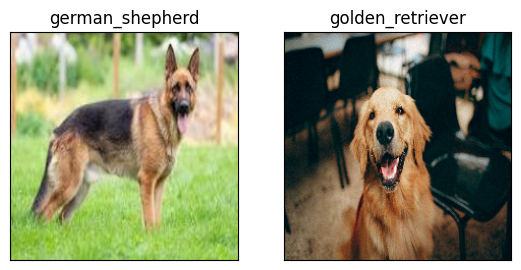

In [95]:
# Check custom image predictions

plt.figure(figsize=(10,10))

for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
